In [20]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

In [21]:
from transformers import AutoModel
import numpy as np
import cv2
import torch

# Load the model and tokenizer
model = AutoModel.from_pretrained("OpenGVLab/ViCLIP-L-14-hf", trust_remote_code=True)
tokenizer = model.tokenizer
model_tokenizer = {"viclip": model, "tokenizer": tokenizer}
print("Model loaded")

# Video data
def _frame_from_video(video):
    while video.isOpened():
        success, frame = video.read()
        if success:
            yield frame
        else:
            break

video = cv2.VideoCapture('test.mp4')
frames = [x for x in _frame_from_video(video)]

c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\timm\models\layers\__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\timm\models\registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


Model loaded


In [22]:
frames_copy = frames.copy()

In [21]:
frames = frames_copy.copy()

In [13]:
frames = frames[10:70]

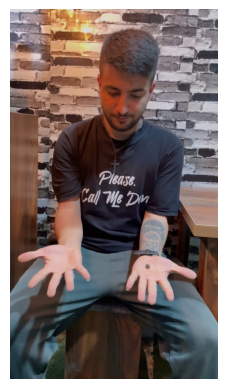

In [23]:
# Display the first frame
plt.imshow(cv2.cvtColor(frames[47], cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [27]:
# Helper functions
v_mean = np.array([0.485, 0.456, 0.406]).reshape(1, 1, 3)
v_std = np.array([0.229, 0.224, 0.225]).reshape(1, 1, 3)

def normalize(data):
    return (data / 255.0 - v_mean) / v_std

def frames2tensor(frame, target_size=(224, 224), device=torch.device('cuda')):
    frame = cv2.resize(frame[:, :, ::-1], target_size)
    frame = normalize(frame)
    frame = np.transpose(frame, (2, 0, 1))  # Change to (C, H, W) format
    frame_tensor = torch.from_numpy(frame).to(device, non_blocking=True).float().unsqueeze(0).unsqueeze(0)
    return frame_tensor

def get_text_feat_dict(texts, clip, tokenizer):
    text_feat_d = {}
    for t in texts:
        feat = clip.get_text_features(t, tokenizer)
        text_feat_d[t] = feat
    return text_feat_d

def get_vid_feat(frame_tensor, clip):
    return clip.get_vid_features(frame_tensor)

def retrieve_text_for_frame(frame, texts, models, topk=2, device=torch.device('cuda')):
    clip, tokenizer = models['viclip'], models['tokenizer']
    clip = clip.to(device)
    frame_tensor = frames2tensor(frame, device=device)
    vid_feat = get_vid_feat(frame_tensor, clip)

    text_feat_d = get_text_feat_dict(texts, clip, tokenizer)
    text_feats = [text_feat_d[t] for t in texts]
    text_feats_tensor = torch.cat(text_feats, 0)

    probs, idxs = clip.get_predict_label(vid_feat, text_feats_tensor, top=topk)
    ret_texts = [texts[i] for i in idxs.cpu().numpy()[0].tolist()]
    return ret_texts, probs.cpu().numpy()[0]

In [31]:
# Text candidates
text_candidates = ["Hands with fingers spread", "Two closed fists"]

texts_list = []
probs_list = []
# Process each frame and print predictions
for i, frame in enumerate(frames):
    texts, probs = retrieve_text_for_frame(frame, text_candidates, models=model_tokenizer, topk=2)
    print(f"Frame {i+1}:")
    for t, p in zip(texts, probs):
        print(f"  text: {t} ~ prob: {p:.4f}")
    texts_list.append(texts)
    probs_list.append(probs)

Frame 1:
  text: Two closed fists ~ prob: 0.7814
  text: Hands with fingers spread ~ prob: 0.2186
Frame 2:
  text: Two closed fists ~ prob: 0.7814
  text: Hands with fingers spread ~ prob: 0.2186
Frame 3:
  text: Two closed fists ~ prob: 0.8488
  text: Hands with fingers spread ~ prob: 0.1512
Frame 4:
  text: Two closed fists ~ prob: 0.7180
  text: Hands with fingers spread ~ prob: 0.2820
Frame 5:
  text: Two closed fists ~ prob: 0.6985
  text: Hands with fingers spread ~ prob: 0.3015
Frame 6:
  text: Two closed fists ~ prob: 0.7153
  text: Hands with fingers spread ~ prob: 0.2847
Frame 7:
  text: Two closed fists ~ prob: 0.7511
  text: Hands with fingers spread ~ prob: 0.2489
Frame 8:
  text: Two closed fists ~ prob: 0.7308
  text: Hands with fingers spread ~ prob: 0.2692
Frame 9:
  text: Hands with fingers spread ~ prob: 0.7173
  text: Two closed fists ~ prob: 0.2827
Frame 10:
  text: Hands with fingers spread ~ prob: 0.7219
  text: Two closed fists ~ prob: 0.2781
Frame 11:
  text: H

In [28]:
texts_list = []
probs_list = []
# Process each frame and print predictions
for i, frame in enumerate(full_images):
    texts, probs = retrieve_text_for_frame(frame, text_candidates, models=model_tokenizer, topk=2)
    print(f"Frame {i+1}:")
    for t, p in zip(texts, probs):
        print(f"  text: {t} ~ prob: {p:.4f}")
    texts_list.append(texts)
    probs_list.append(probs)

c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\torch\_dynamo\eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\torch\utils\checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


Frame 1:
  text: An object is placed on the hand ~ prob: 0.5221
  text: Hand is empty ~ prob: 0.4779
Frame 2:
  text: An object is placed on the hand ~ prob: 0.5221
  text: Hand is empty ~ prob: 0.4779
Frame 3:
  text: Hand is empty ~ prob: 0.9304
  text: An object is placed on the hand ~ prob: 0.0696
Frame 4:
  text: Hand is empty ~ prob: 0.9087
  text: An object is placed on the hand ~ prob: 0.0913
Frame 5:
  text: Hand is empty ~ prob: 0.9835
  text: An object is placed on the hand ~ prob: 0.0165
Frame 6:
  text: Hand is empty ~ prob: 0.9874
  text: An object is placed on the hand ~ prob: 0.0126
Frame 7:
  text: Hand is empty ~ prob: 0.9908
  text: An object is placed on the hand ~ prob: 0.0092
Frame 8:
  text: Hand is empty ~ prob: 0.9709
  text: An object is placed on the hand ~ prob: 0.0291
Frame 9:
  text: Hand is empty ~ prob: 0.9709
  text: An object is placed on the hand ~ prob: 0.0291
Frame 10:
  text: Hand is empty ~ prob: 0.9501
  text: An object is placed on the hand ~ pr

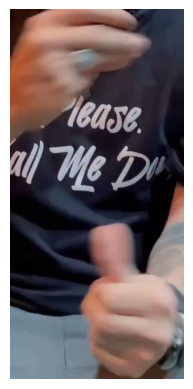

In [30]:
# Get index of the frame with the highest probability for the first text candidate
max_prob_idx = np.argmax(probs_list, axis=0)[0]
max_prob_frame = full_images[max_prob_idx]

# Display the frame with the highest probability for the first text candidate
plt.imshow(cv2.cvtColor(max_prob_frame, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

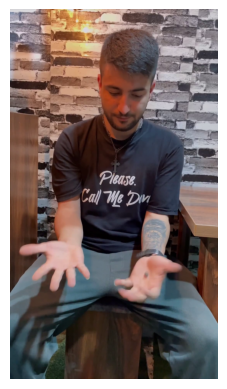

In [44]:
# Display the first frame
plt.imshow(cv2.cvtColor(frames[max_prob_idx], cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [45]:
image = max_prob_frame

# Text candidates
text_candidates = ["An object is placed on the right hand", "An object is placed on the left hand"]

# Helper functions
v_mean = np.array([0.485, 0.456, 0.406]).reshape(1, 1, 3)
v_std = np.array([0.229, 0.224, 0.225]).reshape(1, 1, 3)

def normalize(data):
    return (data / 255.0 - v_mean) / v_std

def image2tensor(img, target_size=(224, 224), device=torch.device('cuda')):
    img = cv2.resize(img[:, :, ::-1], target_size)  # Resize and convert BGR to RGB
    img = normalize(img)  # Normalize image
    img = np.transpose(img, (2, 0, 1))  # Change to (C, H, W) format
    img_tensor = torch.from_numpy(img).to(device, non_blocking=True).float().unsqueeze(0).unsqueeze(0)
    return img_tensor

def get_text_feat_dict(texts, clip, tokenizer):
    text_feat_d = {}
    for t in texts:
        feat = clip.get_text_features(t, tokenizer)
        text_feat_d[t] = feat
    return text_feat_d

def get_img_feat(img_tensor, clip):
    return clip.get_vid_features(img_tensor)

def retrieve_text_for_image(img, texts, models, topk=2, device=torch.device('cuda')):
    clip, tokenizer = models['viclip'], models['tokenizer']
    clip = clip.to(device)
    img_tensor = image2tensor(img, device=device)
    img_feat = get_img_feat(img_tensor, clip)

    text_feat_d = get_text_feat_dict(texts, clip, tokenizer)
    text_feats = [text_feat_d[t] for t in texts]
    text_feats_tensor = torch.cat(text_feats, 0)

    probs, idxs = clip.get_predict_label(img_feat, text_feats_tensor, top=topk)
    ret_texts = [texts[i] for i in idxs.cpu().numpy()[0].tolist()]
    return ret_texts, probs.cpu().numpy()[0]

# Perform the retrieval on the image
texts, probs = retrieve_text_for_image(image, text_candidates, models=model_tokenizer, topk=2)

# Print results
for t, p in zip(texts, probs):
    print(f'text: {t} ~ prob: {p:.4f}')

c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\torch\_dynamo\eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\torch\utils\checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


text: An object is placed on the left hand ~ prob: 0.6961
text: An object is placed on the right hand ~ prob: 0.3039


In [50]:
import mediapipe as mp

# Initialize MediaPipe Hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=2, min_detection_confidence=0.7)

image = max_prob_frame

# Detect hands and get bounding boxes
def get_hand_bboxes(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = hands.process(image_rgb)
    bboxes = []

    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            # Get min/max x and y coordinates of the landmarks
            x_coords = [landmark.x * image.shape[1] for landmark in hand_landmarks.landmark]
            y_coords = [landmark.y * image.shape[0] for landmark in hand_landmarks.landmark]
            xmin, xmax = int(min(x_coords)), int(max(x_coords))
            ymin, ymax = int(min(y_coords)), int(max(y_coords))
            bboxes.append((xmin, ymin, xmax, ymax))
    
    return bboxes

# Get bounding boxes around hands
bboxes = get_hand_bboxes(image)

# Crop the image for each hand
cropped_images = [image[ymin:ymax, xmin:xmax] for xmin, ymin, xmax, ymax in bboxes]
print(f"Detected {len(cropped_images)} hands")

# Crop both the hands together
# Get the overall min and max coordinates to include both hands in a single crop
xmin = min([box[0] for box in bboxes])
ymin = min([box[1] for box in bboxes])
xmax = max([box[2] for box in bboxes])
ymax = max([box[3] for box in bboxes])

# Crop the image to include both hands
cropped_image_full = image[ymin:ymax, xmin:xmax]

Detected 2 hands


In [ ]:
import mediapipe as mp

# Initialize MediaPipe Hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=2, min_detection_confidence=0.7)

# Detect hands and get bounding boxes
def get_hand_bboxes(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = hands.process(image_rgb)
    bboxes = []

    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            # Get min/max x and y coordinates of the landmarks
            x_coords = [landmark.x * image.shape[1] for landmark in hand_landmarks.landmark]
            y_coords = [landmark.y * image.shape[0] for landmark in hand_landmarks.landmark]
            xmin, xmax = int(min(x_coords)), int(max(x_coords))
            ymin, ymax = int(min(y_coords)), int(max(y_coords))
            bboxes.append((xmin, ymin, xmax, ymax))
    
    return bboxes

full_images = []
for id, image in enumerate(frames):
    # Get bounding boxes around hands
    bboxes = get_hand_bboxes(image)

    # Crop the image for each hand
    cropped_images = [image[ymin:ymax, xmin:xmax] for xmin, ymin, xmax, ymax in bboxes]
    print(f"Frame {id} - Detected {len(cropped_images)} hands")

    if len(cropped_images) != 2:
        continue
    # Crop both the hands together
    # Get the overall min and max coordinates to include both hands in a single crop
    xmin = min([box[0] for box in bboxes])
    ymin = min([box[1] for box in bboxes])
    xmax = max([box[2] for box in bboxes])
    ymax = max([box[3] for box in bboxes])

    # Crop the image to include both hands
    cropped_image_full = image[ymin:ymax, xmin:xmax]

    full_images.append(cropped_image_full)

Frame 0 - Detected 2 hands
Frame 1 - Detected 2 hands
Frame 2 - Detected 0 hands
Frame 3 - Detected 1 hands
Frame 4 - Detected 1 hands
Frame 5 - Detected 1 hands
Frame 6 - Detected 1 hands
Frame 7 - Detected 1 hands
Frame 8 - Detected 0 hands
Frame 9 - Detected 0 hands
Frame 10 - Detected 0 hands
Frame 11 - Detected 1 hands
Frame 12 - Detected 1 hands
Frame 13 - Detected 0 hands
Frame 14 - Detected 1 hands
Frame 15 - Detected 1 hands
Frame 16 - Detected 1 hands
Frame 17 - Detected 1 hands
Frame 18 - Detected 1 hands
Frame 19 - Detected 1 hands
Frame 20 - Detected 1 hands
Frame 21 - Detected 2 hands
Frame 22 - Detected 2 hands
Frame 23 - Detected 2 hands
Frame 24 - Detected 2 hands
Frame 25 - Detected 2 hands
Frame 26 - Detected 2 hands
Frame 27 - Detected 2 hands
Frame 28 - Detected 2 hands
Frame 29 - Detected 2 hands
Frame 30 - Detected 2 hands
Frame 31 - Detected 2 hands
Frame 32 - Detected 2 hands
Frame 33 - Detected 2 hands
Frame 34 - Detected 2 hands
Frame 35 - Detected 2 hands
Fr

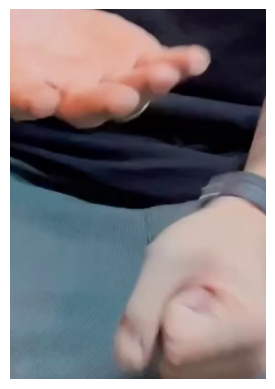

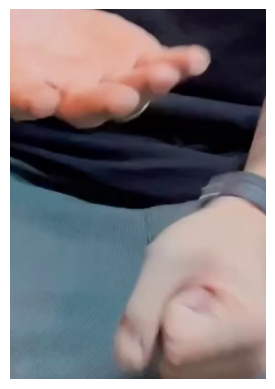

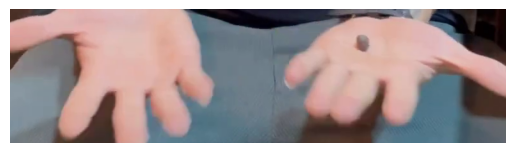

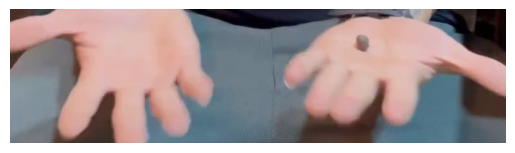

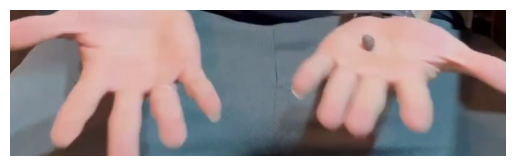

...

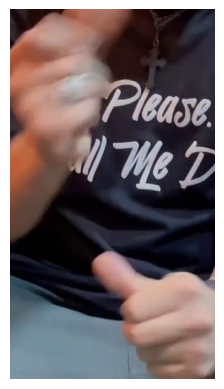

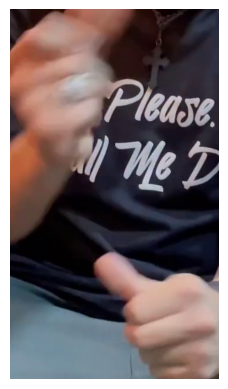

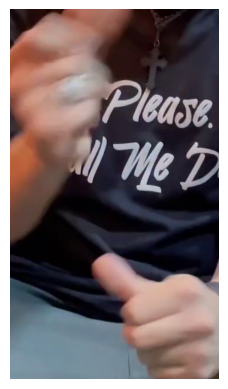

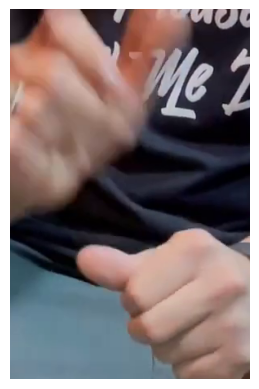

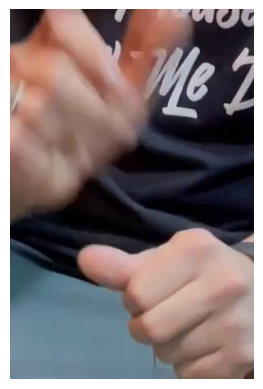

In [25]:
# Display all the cropped images
for i, image in enumerate(full_images):
    # plt.subplot(len(full_images), 1, i+1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

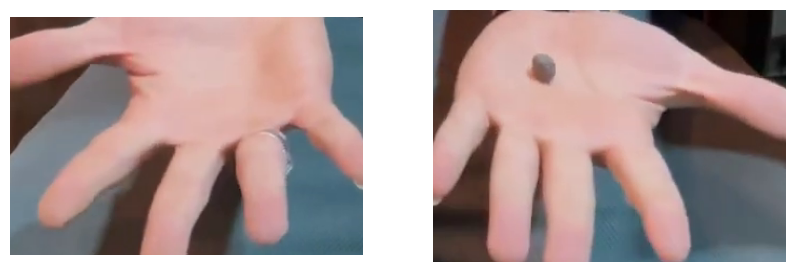

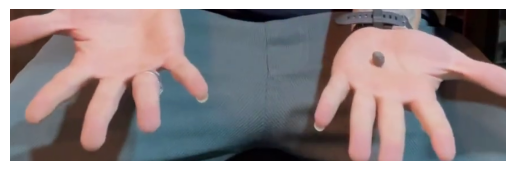

In [51]:
# Display the cropped images
fig, axes = plt.subplots(1, len(cropped_images), figsize=(10, 5))
for i, cropped_image in enumerate(cropped_images):
    axes[i].imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    axes[i].axis("off")
plt.show()

# Display the cropped image with both hands
plt.imshow(cv2.cvtColor(cropped_image_full, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [49]:
text_candidates = ["An item is resting on the hand", "The hand is empty"]

# Perform the retrieval on each cropped image
for i, cropped_image in enumerate(cropped_images):
    texts, probs = retrieve_text_for_image(cropped_image, text_candidates, models=model_tokenizer, topk=2)
    print(f"Hand {i+1}:")
    for t, p in zip(texts, probs):
        print(f"  text: {t} ~ prob: {p:.4f}")

c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\torch\_dynamo\eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
c:\Users\Sai\Documents\Neu\video-annotation\.venv\Lib\site-packages\torch\utils\checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


Hand 1:
  text: The hand is empty ~ prob: 0.8898
  text: An item is resting on the hand ~ prob: 0.1102
Hand 2:
  text: The hand is empty ~ prob: 0.5531
  text: An item is resting on the hand ~ prob: 0.4469


In [17]:
image_name = "temp2.jpg"
# read the image
image = cv2.imread(image_name)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [19]:
text_candidates = ["An object is placed on the hand", "Hand is empty"]
texts, probs = retrieve_text_for_image(image, text_candidates, models=model_tokenizer, topk=2)
for t, p in zip(texts, probs):
    print(f"  text: {t} ~ prob: {p:.4f}")

NameError: name 'retrieve_text_for_image' is not defined

In [11]:
image_name = "temp.jpg"
# read the image
image = cv2.imread(image_name)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Wrist: (562.6489326357841, 31.989807844161987)
Index Finger Tip: (646.9459939002991, 212.11266660690308)
Middle Finger Tip: (564.5374968647957, 233.94423151016235)
Ring Finger Tip: (519.564579129219, 214.4680609703064)
Pinky Finger Tip: (464.7165974974632, 166.5049774646759)
Wrist: (195.79974949359894, -6.233974099159241)
Index Finger Tip: (41.60749450325966, 151.9052152633667)
Middle Finger Tip: (126.73014208674431, 191.10993361473083)
Ring Finger Tip: (206.46256625652313, 168.67204356193542)
Pinky Finger Tip: (286.62821009755135, 119.72600555419922)


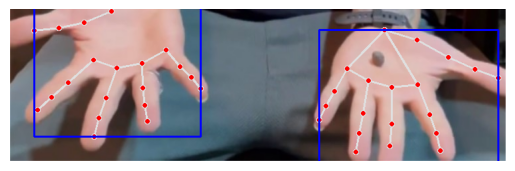

In [14]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

# Initialize MediaPipe Hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=2, min_detection_confidence=0.7)
mp_drawing = mp.solutions.drawing_utils

# Load the image from a file
image_path = 'temp.jpg'  # Replace with the path to your image file
image = cv2.imread(image_path)

# Convert the image from BGR to RGB format for MediaPipe
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Detect hand keypoints
results = hands.process(image_rgb)

# Check if any hands are detected
if results.multi_hand_landmarks:
    for hand_landmarks in results.multi_hand_landmarks:
        # Draw landmarks on the image
        mp_drawing.draw_landmarks(image, hand_landmarks, mp_hands.HAND_CONNECTIONS)

        # Extract keypoints for analysis
        keypoints = [(landmark.x * image.shape[1], landmark.y * image.shape[0]) for landmark in hand_landmarks.landmark]

        # Example: Print keypoint coordinates (wrist, index finger tip, etc.)
        print("Wrist:", keypoints[0])
        print("Index Finger Tip:", keypoints[8])
        print("Middle Finger Tip:", keypoints[12])
        print("Ring Finger Tip:", keypoints[16])
        print("Pinky Finger Tip:", keypoints[20])

        # Define a region of interest (ROI) based on keypoints
        x_min = min([int(x) for x, y in keypoints])
        x_max = max([int(x) for x, y in keypoints])
        y_min = min([int(y) for x, y in keypoints])
        y_max = max([int(y) for x, y in keypoints])

        # Draw bounding box around the hand area for visualization
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

# Display the image with keypoints and bounding box
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()